In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/state-farm-distracted-driver-detection/sample_submission.csv
/kaggle/input/state-farm-distracted-driver-detection/driver_imgs_list.csv
/kaggle/input/state-farm-distracted-driver-detection/imgs/test/img_96590.jpg
/kaggle/input/state-farm-distracted-driver-detection/imgs/test/img_32366.jpg
/kaggle/input/state-farm-distracted-driver-detection/imgs/test/img_99675.jpg
/kaggle/input/state-farm-distracted-driver-detection/imgs/test/img_85937.jpg
/kaggle/input/state-farm-distracted-driver-detection/imgs/test/img_73903.jpg
/kaggle/input/state-farm-distracted-driver-detection/imgs/test/img_89410.jpg
/kaggle/input/state-farm-distracted-driver-detection/imgs/test/img_70462.jpg
/kaggle/input/state-farm-distracted-driver-detection/imgs/test/img_45622.jpg
/kaggle/input/state-farm-distracted-driver-detection/imgs/test/img_55507.jpg
/kaggle/input/state-farm-distracted-driver-detection/imgs/test/img_34204.jpg
/kaggle/input/state-farm-distracted-driver-detection/imgs/test/img_16279.jpg
/kag

In [2]:
!pip install split-folders

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm
import datetime

from getpass import getpass
import os
import cv2, glob

import splitfolders

from sklearn.model_selection import train_test_split

import tensorflow as tf
import tensorflow.keras as keras

from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense,Dropout
from tensorflow.keras.utils import plot_model

from tensorflow.keras.applications import VGG16, VGG19
from tensorflow.keras.applications.resnet import ResNet50
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.imagenet_utils import preprocess_input
from tensorflow.keras.callbacks import EarlyStopping


from tensorflow.keras import models
from tensorflow.keras import layers
from tensorflow.keras import optimizers

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.imagenet_utils import preprocess_input

from tensorflow.keras.applications.imagenet_utils import decode_predictions

from tensorflow.keras.models import load_model

In [4]:
!nvidia-smi

Tue Jun 27 14:35:47 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.161.03   Driver Version: 470.161.03   CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   34C    P8     9W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
|   1  Tesla T4            Off  | 00000000:00:05.0 Off |                    0 |
| N/A   

In [5]:
df = pd.read_csv("/kaggle/input/state-farm-distracted-driver-detection/driver_imgs_list.csv")
df.head()

,subject,classname,img
0,p002,c0,img_44733.jpg
1,p002,c0,img_72999.jpg
2,p002,c0,img_25094.jpg
3,p002,c0,img_69092.jpg
4,p002,c0,img_92629.jpg


In [6]:
df.shape

(22424, 3)

In [7]:
df.describe()

,subject,classname,img
count,22424,22424,22424
unique,26,10,22424
top,p021,c0,img_44733.jpg
freq,1237,2489,1


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22424 entries, 0 to 22423
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   subject    22424 non-null  object
 1   classname  22424 non-null  object
 2   img        22424 non-null  object
dtypes: object(3)
memory usage: 525.7+ KB


In [9]:
df['classname'].unique(),df['subject'].unique(),df['img'].unique()

(array(['c0', 'c1', 'c2', 'c3', 'c4', 'c5', 'c6', 'c7', 'c8', 'c9'],
       dtype=object),
 array(['p002', 'p012', 'p014', 'p015', 'p016', 'p021', 'p022', 'p024',
        'p026', 'p035', 'p039', 'p041', 'p042', 'p045', 'p047', 'p049',
        'p050', 'p051', 'p052', 'p056', 'p061', 'p064', 'p066', 'p072',
        'p075', 'p081'], dtype=object),
 array(['img_44733.jpg', 'img_72999.jpg', 'img_25094.jpg', ...,
        'img_25946.jpg', 'img_67850.jpg', 'img_9684.jpg'], dtype=object))

In [10]:
df['img'].nunique()

22424

In [11]:
%config Completer.use_jedi = False

All images are saved with unique names and are different from each other

In [12]:
datadir='/kaggle/input/state-farm-distracted-driver-detection/imgs/train'
splitfolders.ratio(datadir,output='dataa',ratio=(0.8,0.2),group_prefix=None,move=False)

Copying files: 22424 files [02:34, 145.06 files/s]


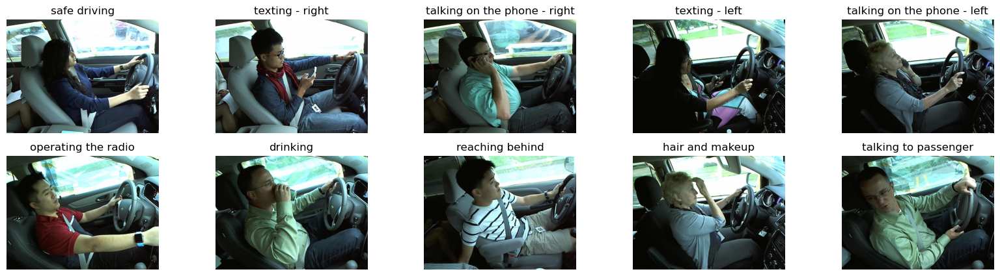

In [14]:
state = ['safe driving', 'texting - right', 'talking on the phone - right', 'texting - left', 'talking on the phone - left',
         'operating the radio', 'drinking', 'reaching behind', 'hair and makeup', 'talking to passenger', 'UNKNOWN']
#print(len(state)) # in datset we have given 10 data classed here we add one extra class as 'UNKNOWN' to fit data who arenot in the dataset
def Display(path,Class=None):
    img=cv2.imread(path)
    img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    if Class==None:
        plt.figure()
        plt.title(state[10])# in case of class unknown it wil take UNKOWN as class
        plt.imshow(img)
        plt.axis("OFF")
    else :
        plt.subplot(2,5,Class+1)
        plt.title(state[Class])
        plt.imshow(img)
        plt.axis("OFF")

plt.figure(figsize=(20, 5))
Display("/kaggle/input/state-farm-distracted-driver-detection/imgs/train/c0/img_100050.jpg", 0)
Display("/kaggle/input/state-farm-distracted-driver-detection/imgs/train/c1/img_100045.jpg", 1)
Display("/kaggle/input/state-farm-distracted-driver-detection/imgs/train/c2/img_100029.jpg", 2)
Display("/kaggle/input/state-farm-distracted-driver-detection/imgs/train/c3/img_100006.jpg", 3)
Display("/kaggle/input/state-farm-distracted-driver-detection/imgs/train/c4/img_100225.jpg", 4)
Display("/kaggle/input/state-farm-distracted-driver-detection/imgs/train/c5/img_10000.jpg", 5)
Display("/kaggle/input/state-farm-distracted-driver-detection/imgs/train/c6/img_100036.jpg", 6)
Display("/kaggle/input/state-farm-distracted-driver-detection/imgs/train/c7/img_100057.jpg", 7)
Display("/kaggle/input/state-farm-distracted-driver-detection/imgs/train/c8/img_100015.jpg", 8)
Display("/kaggle/input/state-farm-distracted-driver-detection/imgs/train/c9/img_100090.jpg", 9)
        
    

In [15]:
dense_train_gen = ImageDataGenerator(rescale=1./255,dtype='float32')
dense_train = dense_train_gen.flow_from_directory('/kaggle/working/dataa/train', batch_size=128, target_size= (256, 256))

dense_val_gen = ImageDataGenerator(rescale=1./255,dtype='float32')
dense_val = dense_val_gen.flow_from_directory('/kaggle/working/dataa/val', batch_size=128, target_size= (256, 256))

Found 17934 images belonging to 10 classes.
Found 4490 images belonging to 10 classes.


In [26]:
strategy = tf.distribute.MirroredStrategy()
print('Number of devices: {}'.format(strategy.num_replicas_in_sync))

Number of devices: 2


In [27]:
model_dense = models.Sequential()
model_dense.add(Flatten(input_shape=(256, 256, 3)))
model_dense.add(Dense(512, activation='relu'))
model_dense.add(Dense(256, activation='relu'))
model_dense.add(Dense(128, activation='relu'))
model_dense.add(Dense(10, activation='softmax'))
model_dense.compile(optimizer='adam',
                loss='categorical_crossentropy',
                metrics=['accuracy'])

In [29]:
# buiding a model inside the strategy scope
with strategy.scope():
    multi_gpu_model = model_dense
    
multi_gpu_model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_3 (Flatten)         (None, 196608)            0         
                                                                 
 dense_12 (Dense)            (None, 512)               100663808 
                                                                 
 dense_13 (Dense)            (None, 256)               131328    
                                                                 
 dense_14 (Dense)            (None, 128)               32896     
                                                                 
 dense_15 (Dense)            (None, 10)                1290      
                                                                 
Total params: 100,829,322
Trainable params: 100,829,322
Non-trainable params: 0
_________________________________________________________________


In [30]:
model_dense.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_3 (Flatten)         (None, 196608)            0         
                                                                 
 dense_12 (Dense)            (None, 512)               100663808 
                                                                 
 dense_13 (Dense)            (None, 256)               131328    
                                                                 
 dense_14 (Dense)            (None, 128)               32896     
                                                                 
 dense_15 (Dense)            (None, 10)                1290      
                                                                 
Total params: 100,829,322
Trainable params: 100,829,322
Non-trainable params: 0
_________________________________________________________________


In [32]:
BUFFER_SIZE = 10000
BATCH_SIZE_PER_REPLICA = 1024

def get_batch_size(num_gpus=1):
    batch_size = BATCH_SIZE_PER_REPLICA * num_gpus
    print(f'BATCH_SIZE = {batch_size}')
    return batch_size

# Wrap data in Dataset objects.
#train_data = tf.data.Dataset.from_tensor_slices((X_train, y_train))
#test_data = tf.data.Dataset.from_tensor_slices((X_test, y_test))

# the batch size will be defined later based on the number of used GPUs
options = tf.data.Options()
options.experimental_distribute.auto_shard_policy = tf.data.experimental.AutoShardPolicy.OFF
train_data = dense_train.with_options(options).cache().shuffle(BUFFER_SIZE).prefetch(tf.data.AUTOTUNE)
test_data = dense_val.with_options(options)

AttributeError: 'DirectoryIterator' object has no attribute 'with_options'

In [33]:
import tensorflow as tf
from tensorflow.keras import models
from tensorflow.keras.layers import Flatten, Dense

# Check if GPU is available
if tf.test.is_gpu_available():
    # Set the TensorFlow backend to use GPU
    print("traing on GPU")
    tf.keras.backend.set_image_data_format('channels_last')

    # Define the model
    model_dense = models.Sequential()
    model_dense.add(Flatten(input_shape=(256, 256, 3)))
    model_dense.add(Dense(512, activation='relu'))
    model_dense.add(Dense(256, activation='relu'))
    model_dense.add(Dense(128, activation='relu'))
    model_dense.add(Dense(10, activation='softmax'))
    
    # Compile the model
    model_dense.compile(optimizer='adam',
                       loss='categorical_crossentropy',
                       metrics=['accuracy'])

    # Define the distribution strategy for multi-GPU training
    strategy = tf.distribute.MirroredStrategy()

    # Create a distributed model
    with strategy.scope():
        distributed_model = model_dense

    # Train the model
    history_dense = distributed_model.fit(dense_train, epochs=10, validation_data=dense_val)

else:
    print("GPU not available. Training on CPU...")
    # Build, compile, and train your model on CPU as before
    model_dense = models.Sequential()
    model_dense.add(Flatten(input_shape=(256, 256, 3)))
    model_dense.add(Dense(512, activation='relu'))
    model_dense.add(Dense(256, activation='relu'))
    model_dense.add(Dense(128, activation='relu'))
    model_dense.add(Dense(10, activation='softmax'))
    model_dense.compile(optimizer='adam',
                       loss='categorical_crossentropy',
                       metrics=['accuracy'])
    history_dense = model_dense.fit(dense_train, epochs=10, validation_data=dense_val)


traing on GPU
Epoch 1/10
141/141 [==============================] - 86s 602ms/step - loss: 15.6246 - accuracy: 0.3205 - val_loss: 1.0024 - val_accuracy: 0.6726
Epoch 2/10
141/141 [==============================] - 84s 597ms/step - loss: 0.6705 - accuracy: 0.8042 - val_loss: 0.4832 - val_accuracy: 0.8753
Epoch 3/10
141/141 [==============================] - 83s 586ms/step - loss: 0.3929 - accuracy: 0.8943 - val_loss: 0.2737 - val_accuracy: 0.9327
Epoch 4/10
141/141 [==============================] - 83s 590ms/step - loss: 0.2249 - accuracy: 0.9449 - val_loss: 0.1362 - val_accuracy: 0.9733
Epoch 5/10
141/141 [==============================] - 83s 588ms/step - loss: 0.1219 - accuracy: 0.9757 - val_loss: 0.1224 - val_accuracy: 0.9739
Epoch 6/10
141/141 [==============================] - 85s 600ms/step - loss: 0.1003 - accuracy: 0.9790 - val_loss: 0.1737 - val_accuracy: 0.9472
Epoch 7/10
141/141 [==============================] - 84s 597ms/step - loss: 0.0731 - accuracy: 0.9843 - val_loss: 

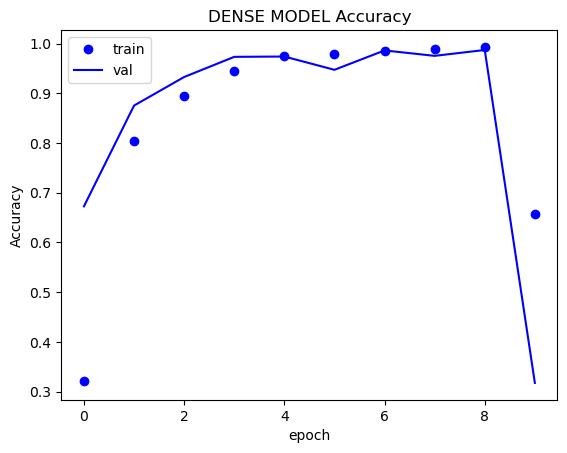

In [34]:
plt.plot(history_dense.history['accuracy'],'bo')
plt.plot(history_dense.history['val_accuracy'],'b')
plt.title('DENSE MODEL Accuracy')
plt.xlabel('epoch')
plt.ylabel('Accuracy') 
plt.legend(['train','val'],loc='upper left')
plt.show()

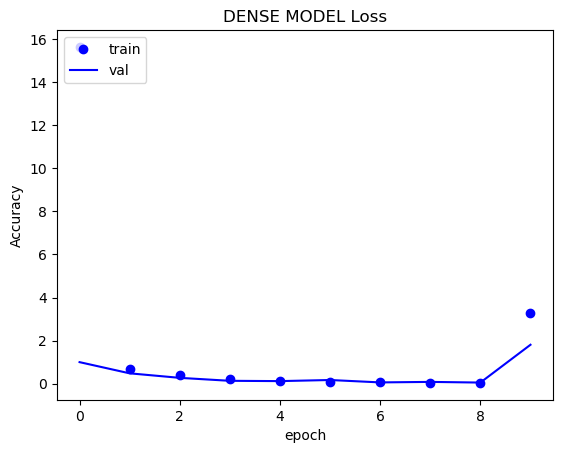

In [35]:
plt.plot(history_dense.history['loss'],'bo')
plt.plot(history_dense.history['val_loss'],'b')
plt.title('DENSE MODEL Loss')
plt.xlabel('epoch')
plt.ylabel('Accuracy')
plt.legend(['train','val'],loc='upper left')
plt.show()

Observation :

In [20]:
model_dense.save('/kaggle/working/first_dense_model.h5')

CNN MODEL

In [15]:
train_gen = ImageDataGenerator(rescale=1./255)
train = train_gen.flow_from_directory('/kaggle/working/dataa/train', batch_size=64, target_size= (256, 256))

val_gen = ImageDataGenerator(rescale=1./255)
val = val_gen.flow_from_directory('/kaggle/working/dataa/val', batch_size=64, target_size= (256, 256))

Found 17934 images belonging to 10 classes.
Found 4490 images belonging to 10 classes.


In [16]:
model_CNN = models.Sequential()
model_CNN.add(Conv2D(32, (3, 3), activation='relu', input_shape=(256, 256, 3)))
model_CNN.add(MaxPooling2D((2, 2)))


model_CNN.add(Conv2D(64, (3, 3), activation='relu'))
model_CNN.add(MaxPooling2D((2, 2)))

model_CNN.add(Conv2D(128, (3, 3), activation='relu'))
model_CNN.add(MaxPooling2D((2, 2)))

model_CNN.add(Flatten())
model_CNN.add(Dense(128, activation='relu'))



model_CNN.add(Dense(10, activation='softmax'))


model_CNN.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 254, 254, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 127, 127, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 125, 125, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 62, 62, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 60, 60, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 30, 30, 128)      0

In [17]:
model_CNN.compile(optimizer='adam',
                loss='categorical_crossentropy',
                metrics=['acc'])

In [18]:
#from IPython.testing import test
history_CNN=model_CNN.fit(train ,epochs=10, batch_size=64,validation_data=val)

Epoch 1/10
281/281 [==============================] - 109s 339ms/step - loss: 0.6619 - acc: 0.7903 - val_loss: 0.0775 - val_acc: 0.9757
Epoch 2/10
281/281 [==============================] - 92s 328ms/step - loss: 0.0597 - acc: 0.9853 - val_loss: 0.0470 - val_acc: 0.9878
Epoch 3/10
281/281 [==============================] - 92s 327ms/step - loss: 0.0161 - acc: 0.9954 - val_loss: 0.0450 - val_acc: 0.9860
Epoch 4/10
281/281 [==============================] - 92s 326ms/step - loss: 0.0114 - acc: 0.9971 - val_loss: 0.0195 - val_acc: 0.9944
Epoch 5/10
281/281 [==============================] - 91s 323ms/step - loss: 0.0069 - acc: 0.9986 - val_loss: 0.0298 - val_acc: 0.9918
Epoch 6/10
281/281 [==============================] - 91s 325ms/step - loss: 0.0175 - acc: 0.9950 - val_loss: 0.0442 - val_acc: 0.9889
Epoch 7/10
281/281 [==============================] - 92s 326ms/step - loss: 0.0162 - acc: 0.9948 - val_loss: 0.0361 - val_acc: 0.9906
Epoch 8/10
281/281 [==============================] - 

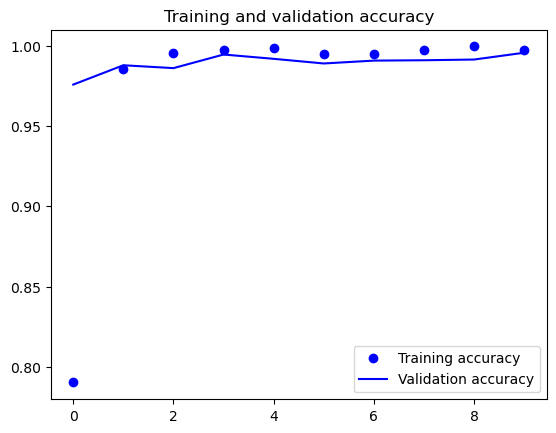

In [19]:
acc = history_CNN.history['acc']
val_acc = history_CNN.history['val_acc']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()

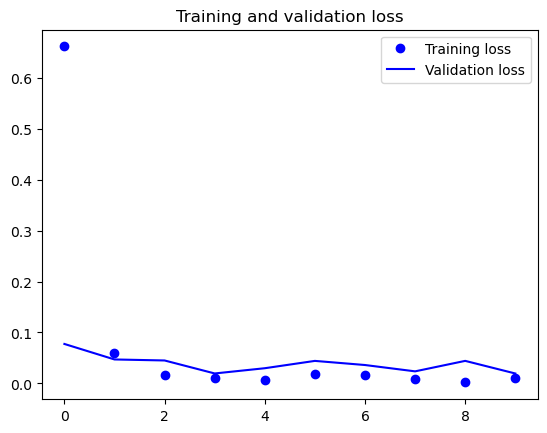

In [20]:
loss = history_CNN.history['loss']
val_loss = history_CNN.history['val_loss']

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [21]:
model_CNN.save('/kaggle/working/CNN_model_final.h5')

Data Augmentation

In [22]:
batch_size = 32
datagen = ImageDataGenerator(rescale = 1/255,
                            zoom_range=0.05,
                            width_shift_range=0.05,
                            height_shift_range=0.05,
                            shear_range=0.05, 
                            fill_mode="nearest")


train = datagen.flow_from_directory('/kaggle/working/dataa/train', batch_size=batch_size, target_size = (256, 256))

val_gen = ImageDataGenerator(rescale = 1/255)
val = val_gen.flow_from_directory('/kaggle/working/dataa/val', batch_size=batch_size, target_size = (256, 256))

Found 17934 images belonging to 10 classes.
Found 4490 images belonging to 10 classes.


In [23]:
for data_batch, labels_batch in train:
    print('data batch shape:', data_batch.shape)
    print('labels batch shape:', labels_batch.shape)
    break

data batch shape: (32, 256, 256, 3)
labels batch shape: (32, 10)


In [24]:
from keras import models
from keras import layers
from tensorflow.keras.layers import Dropout

model_DA = models.Sequential()
model_DA.add(layers.Conv2D(32,(3,3), activation='relu', name='Layer_1', input_shape=(256,256, 3)))
model_DA.add(layers.MaxPooling2D((2, 2)))
model_DA.add(layers.Conv2D(128,(3,3), activation='relu', name='Layer_2'))
model_DA.add(layers.MaxPooling2D((2, 2)))
model_DA.add(layers.Conv2D(128,(3,3), activation='relu', name='Layer_3'))
model_DA.add(layers.MaxPooling2D((2, 2)))
model_DA.add(layers.Conv2D(64,(3,3), activation='relu', name='Layer_4'))
model_DA.add(layers.MaxPooling2D((2, 2)))
model_DA.add(layers.Flatten())
model_DA.add(layers.Dense(512, activation='relu'))
model_DA.add(layers.Dropout(0.4))
model_DA.add(layers.Dense(10, activation='softmax'))

In [ ]:
model_DA.summary()

In [26]:
model_DA.compile(optimizer='rmsprop',
                loss='categorical_crossentropy',
                metrics=['accuracy'])

In [27]:
history_DA = model_DA.fit(
      train,
      epochs=20,
      steps_per_epoch = 150,
      validation_data=val,
      verbose=2,
      validation_steps=50)

Epoch 1/20
150/150 - 88s - loss: 2.3580 - accuracy: 0.1158 - val_loss: 2.2567 - val_accuracy: 0.2050 - 88s/epoch - 588ms/step
Epoch 2/20
150/150 - 85s - loss: 1.5516 - accuracy: 0.4727 - val_loss: 1.0548 - val_accuracy: 0.6281 - 85s/epoch - 564ms/step
Epoch 3/20
150/150 - 84s - loss: 0.9290 - accuracy: 0.6878 - val_loss: 0.4063 - val_accuracy: 0.8656 - 84s/epoch - 561ms/step
Epoch 4/20
150/150 - 84s - loss: 0.5899 - accuracy: 0.8105 - val_loss: 0.2140 - val_accuracy: 0.9413 - 84s/epoch - 559ms/step
Epoch 5/20
150/150 - 84s - loss: 0.4282 - accuracy: 0.8719 - val_loss: 0.1420 - val_accuracy: 0.9581 - 84s/epoch - 559ms/step
Epoch 6/20
150/150 - 83s - loss: 0.3177 - accuracy: 0.9051 - val_loss: 0.1489 - val_accuracy: 0.9500 - 83s/epoch - 553ms/step
Epoch 7/20
150/150 - 81s - loss: 0.2394 - accuracy: 0.9235 - val_loss: 0.1950 - val_accuracy: 0.9481 - 81s/epoch - 537ms/step
Epoch 8/20
150/150 - 84s - loss: 0.2264 - accuracy: 0.9306 - val_loss: 0.1037 - val_accuracy: 0.9719 - 84s/epoch - 561

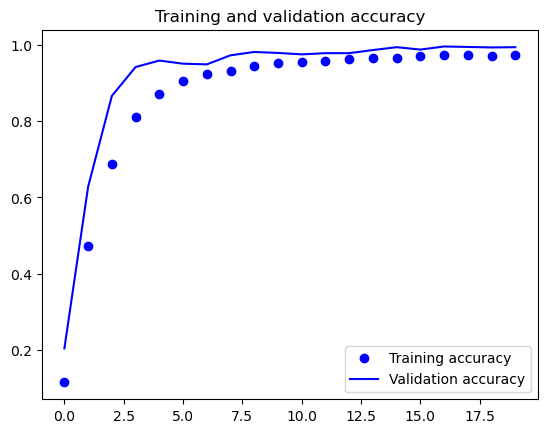

In [28]:
acc = history_DA.history['accuracy']
val_acc = history_DA.history['val_accuracy']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()

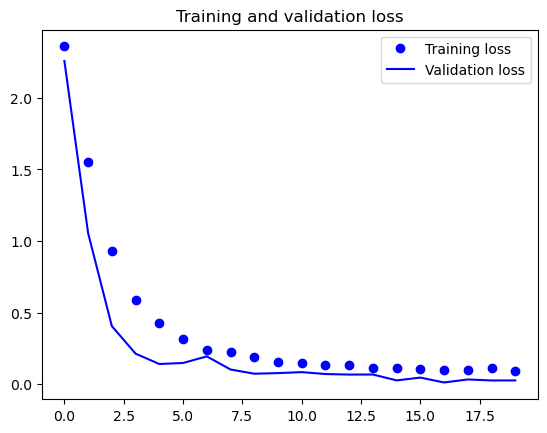

In [29]:
loss = history_DA.history['loss']
val_loss = history_DA.history['val_loss']

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [30]:
model_DA.save("/kaggle/working/Data_Augmentation_model_1.h5")

Frozen Model

In [28]:
batch_size = 32
datagen = ImageDataGenerator(preprocessing_function=preprocess_input,
                            zoom_range=0.05,
                            width_shift_range=0.05,
                            height_shift_range=0.05,
                            shear_range=0.05, 
                            fill_mode="nearest")


train = datagen.flow_from_directory('/kaggle/working/dataa/train', batch_size=batch_size, target_size = (256, 256))

val_gen = ImageDataGenerator(preprocessing_function = preprocess_input)
val = val_gen.flow_from_directory('/kaggle/working/dataa/val', batch_size=batch_size, target_size = (256, 256))

Found 17934 images belonging to 10 classes.
Found 4490 images belonging to 10 classes.


In [17]:
conv_base = VGG16(weights='imagenet',
                  include_top=False,
                  input_shape=(256, 256, 3))

conv_base.summary()

58889256/58889256 [==============================] - 0s 0us/step
Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 256, 256, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 256, 256, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 128, 128, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 128, 128, 128)     147584    
                                                              

In [23]:
model_DL = models.Sequential()
model_DL.add(conv_base)
model_DL.add(layers.Flatten())
model_DL.add(layers.Dense(512, activation='relu'))
model_DL.add(layers.Dropout(0.35))
model_DL.add(layers.Dense(128, activation='relu'))
model_DL.add(layers.Dropout(0.35))
model_DL.add(layers.Dense(32, activation='relu'))
model_DL.add(layers.Dense(10, activation='softmax'))

model_DL.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 8, 8, 512)         14714688  
                                                                 
 flatten (Flatten)           (None, 32768)             0         
                                                                 
 dense (Dense)               (None, 512)               16777728  
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense_1 (Dense)             (None, 128)               65664     
                                                                 
 dropout_1 (Dropout)         (None, 128)               0         
                                                                 
 dense_2 (Dense)             (None, 32)                4

In [39]:
print('This is the number of trainable weights '
      'before freezing the conv base:', len(model_DL.trainable_weights))

This is the number of trainable weights before freezing the conv base: 34


In [40]:
conv_base.trainable = False

In [41]:
print('This is the number of trainable weights '
      'before freezing the conv base:', len(model_DL.trainable_weights))

This is the number of trainable weights before freezing the conv base: 8


In [42]:
model_DL.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 8, 8, 512)         14714688  
                                                                 
 flatten_5 (Flatten)         (None, 32768)             0         
                                                                 
 dense_20 (Dense)            (None, 512)               16777728  
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense_21 (Dense)            (None, 128)               65664     
                                                                 
 dropout_1 (Dropout)         (None, 128)               0         
                                                                 
 dense_22 (Dense)            (None, 32)               

In [22]:
model_DL.compile(optimizer = optimizers.Adam(learning_rate=0.0001),
             loss='categorical_crossentropy',
              metrics=['accuracy'])

history_DL = model_DL.fit(train,
                    epochs=10,
                    steps_per_epoch = 150,
                    validation_data=val,
                    verbose=1)

NameError: name 'model_DL' is not defined

In [ ]:
train_acc, train_loss = model_DL.evaluate(train)

In [ ]:
val_acc, val_loss = model_DL.evaluate(val)

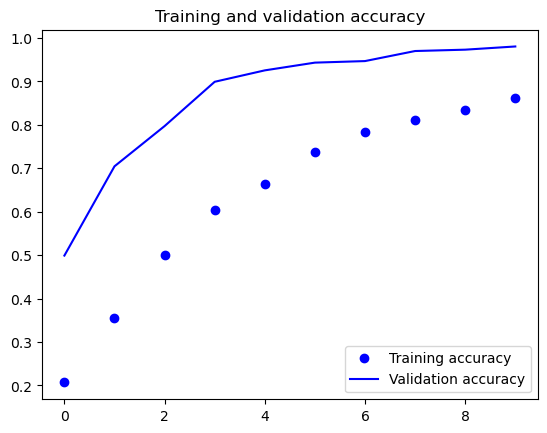

In [45]:
acc = history_DL.history['accuracy']
val_acc = history_DL.history['val_accuracy']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()

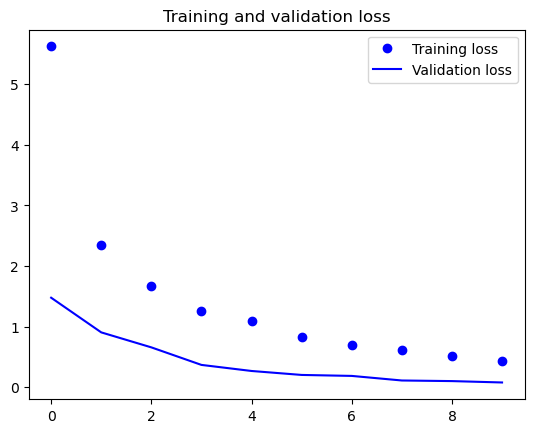

In [46]:
loss = history_DL.history['loss']
val_loss = history_DL.history['val_loss']

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [47]:
model_DL.save('/kaggle/working/driver_detection_Frozen_model.h5')
print("Saved model to kaggle")

Saved model to kaggle


Fine Tuning

In [18]:
conv_base.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 256, 256, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 256, 256, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 128, 128, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 128, 128, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 64, 64, 128)       0     

In [19]:
conv_base.trainable = True

set_trainable = False
for layer in conv_base.layers:
    if layer.name == 'conv5_block1_1_conv':
        set_trainable = True
    if set_trainable:
        layer.trainable = True
    else:
        layer.trainable = False

In [20]:
conv_base.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 256, 256, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 256, 256, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 128, 128, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 128, 128, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 64, 64, 128)       0     

In [24]:
model_copy= keras.models.clone_model(model_DL)
model_copy.build((None, 150, 150, 3))                                
model_copy.compile(optimizer = optimizers.Adam(learning_rate=0.0001),
                   loss='categorical_crossentropy',
                   metrics=['accuracy'])
model_copy.set_weights(model_DL.get_weights())

model_copy.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 8, 8, 512)         14714688  
                                                                 
 flatten (Flatten)           (None, 32768)             0         
                                                                 
 dense (Dense)               (None, 512)               16777728  
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense_1 (Dense)             (None, 128)               65664     
                                                                 
 dropout_1 (Dropout)         (None, 128)               0         
                                                                 
 dense_2 (Dense)             (None, 32)                4

In [25]:
model_DL.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 8, 8, 512)         14714688  
                                                                 
 flatten (Flatten)           (None, 32768)             0         
                                                                 
 dense (Dense)               (None, 512)               16777728  
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense_1 (Dense)             (None, 128)               65664     
                                                                 
 dropout_1 (Dropout)         (None, 128)               0         
                                                                 
 dense_2 (Dense)             (None, 32)                4

In [26]:
model_copy.compile(optimizer = optimizers.Adam(learning_rate=0.0001),
             loss='categorical_crossentropy',
              metrics=['accuracy'])

In [29]:
history_FT = model_copy.fit(
      train,
      steps_per_epoch=100,                 #train.n//train.batch_size,
      epochs=20,
      validation_data=val,
      validation_steps=50,                 #val.n//val.batch_size)
      verbose=1)

Epoch 1/20
100/100 [==============================] - 77s 622ms/step - loss: 6.5676 - accuracy: 0.1784 - val_loss: 1.6947 - val_accuracy: 0.4344
Epoch 2/20
100/100 [==============================] - 62s 618ms/step - loss: 2.9740 - accuracy: 0.2819 - val_loss: 1.2841 - val_accuracy: 0.5312
Epoch 3/20
100/100 [==============================] - 65s 653ms/step - loss: 2.1100 - accuracy: 0.3768 - val_loss: 0.8933 - val_accuracy: 0.6994
Epoch 4/20
100/100 [==============================] - 63s 630ms/step - loss: 1.8005 - accuracy: 0.4556 - val_loss: 0.6517 - val_accuracy: 0.8025
Epoch 5/20
100/100 [==============================] - 64s 636ms/step - loss: 1.4854 - accuracy: 0.5381 - val_loss: 0.5869 - val_accuracy: 0.8131
Epoch 6/20
100/100 [==============================] - 63s 628ms/step - loss: 1.2215 - accuracy: 0.6028 - val_loss: 0.4868 - val_accuracy: 0.8375
Epoch 7/20
100/100 [==============================] - 64s 635ms/step - loss: 1.0069 - accuracy: 0.6784 - val_loss: 0.3593 - val_ac

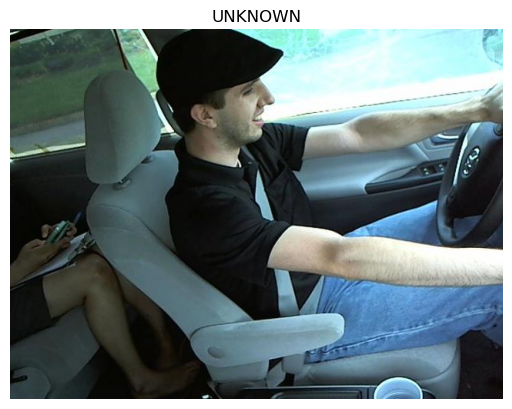

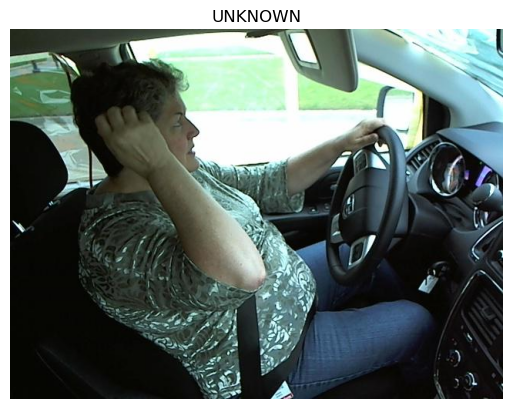

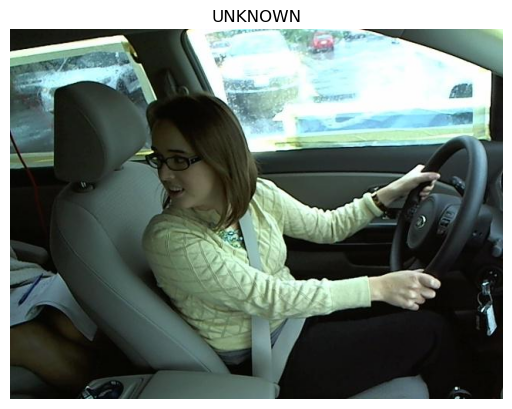

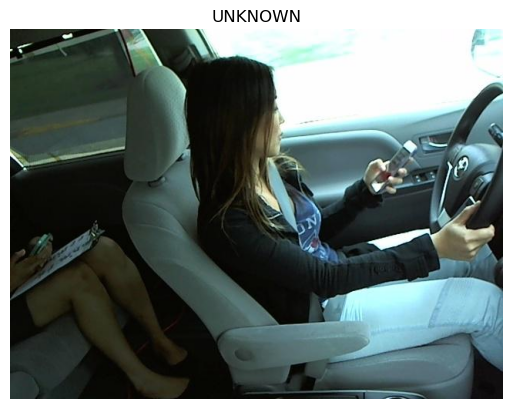

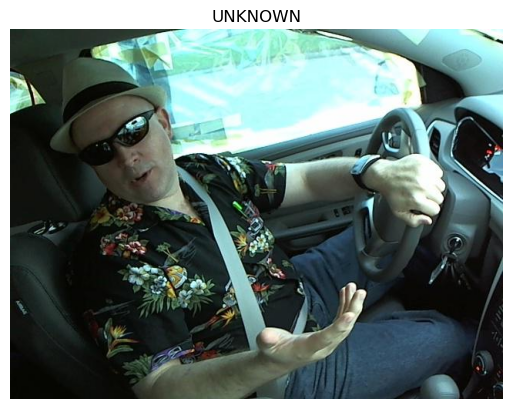

In [30]:
Display("/kaggle/input/state-farm-distracted-driver-detection/imgs/test/img_10.jpg")
Display("/kaggle/input/state-farm-distracted-driver-detection/imgs/test/img_100008.jpg")
Display("/kaggle/input/state-farm-distracted-driver-detection/imgs/test/img_100049.jpg")
Display("/kaggle/input/state-farm-distracted-driver-detection/imgs/test/img_100163.jpg")
Display("/kaggle/input/state-farm-distracted-driver-detection/imgs/test/img_100300.jpg")

In [31]:
test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

test = test_datagen.flow_from_directory('/kaggle/input/state-farm-distracted-driver-detection/imgs/.',
                                                  classes=['test'],
                                                  target_size=(256, 256),
                                                  batch_size = 20,
                                                  class_mode = None,
                                                  shuffle = False)

Found 79726 images belonging to 1 classes.


In [32]:
Predict = model_copy.predict(test)

3987/3987 [==============================] - 730s 182ms/step


In [49]:
state[Predict[789].argmax()]

'texting - left'

In [33]:
import os

img_names = []
for img_name in os.listdir('/kaggle/input/state-farm-distracted-driver-detection/imgs/test'):
    img_names.append(img_name)

img_names = np.sort(img_names)

In [34]:
from PIL import Image

tags = { 0: "safe driving",
        1: "texting - right",
        2: "talking on the phone - right",
        3: "texting - left",
        4: "talking on the phone - left",
        5: "operating the radio",
        6: "drinking",
        7: "reaching behind",
        8: "hair and makeup",
        9: "talking to passenger" }

def load_images_and_labels(data_path):
    x = []
    i = 0
    for img_name in img_names:

        img = cv2.imread(data_path + '/' + img_name)
        if img is not None:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img_array = Image.fromarray(img, 'RGB')
            img_rs = img_array.resize((150, 150))
            img_rs = np.array(img_rs)
            x.append(img_rs)
            i+=1
        if i ==100:
            break
    return x

In [35]:
x = load_images_and_labels('/kaggle/input/state-farm-distracted-driver-detection/imgs/test')

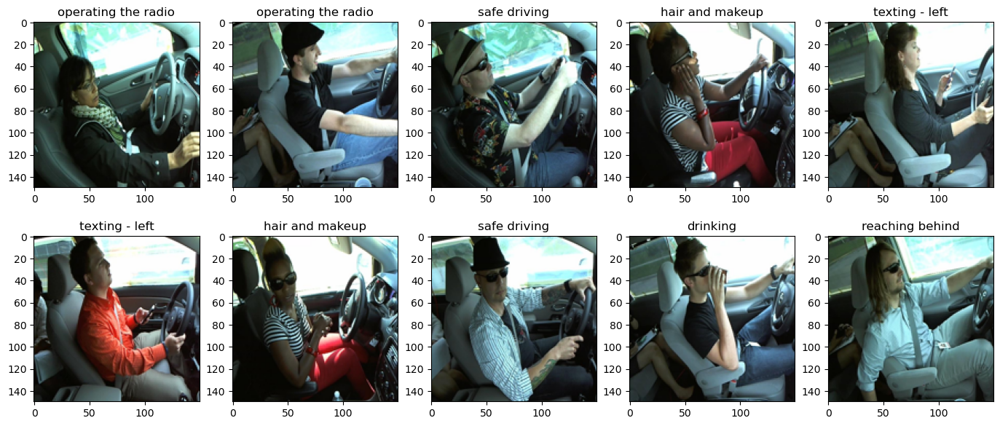

In [36]:
import random

plt.figure(figsize=(17, 7))

for i in range(0, 10, 1):
#     ind = random.randint(0, 8)
    plt.subplot(2, 5, i+1)
    plt.imshow(x[i])
    plt.title(tags[np.argmax(Predict[i])])

In [37]:
Predict[0]
np.argmax(Predict[0])

5

In [38]:
sample_sub = pd.read_csv("/kaggle/input/state-farm-distracted-driver-detection/sample_submission.csv")
sample_sub.head()

,img,c0,c1,c2,c3,c4,c5,c6,c7,c8,c9
0,img_1.jpg,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1
1,img_10.jpg,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1
2,img_100.jpg,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1
3,img_1000.jpg,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1
4,img_100000.jpg,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1
